## <b> <span style='color:#e61227'>|</span>   **Helmet Violation Detection Using YOLOv9 and PaddleOCR**</b>

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import yaml
import os

# Define the dataset_path, ensuring it includes the path to your dataset
dataset_path = '/content/drive/My Drive/Colab Notebooks/dataset/HelmetViolationsV2'  # Update with your dataset path

# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Plate
- WithHelmet
- WithoutHelmet
nc: 3
roboflow:
  license: Private
  project: helmetviolations
  url: https://app.roboflow.com/helmet-nztej/helmetviolations/2
  version: 2
  workspace: helmet-nztej
test: ../test/images
train: ../train/images
val: ../valid/images



## <b>3 <span style='color:#e61227'>|</span> Install And Import Essential Libreries </b>

In [3]:
# Install Essential Libraries
!pip install ultralytics
!pip install paddlepaddle-gpu -f https://www.paddlepaddle.org.cn/whl/linux/mkl/paddlepaddle_gpu.html
!pip install paddleocr
from IPython import display
display.clear_output()

In [ ]:
# Import Essential Libraries
import pandas as pd
from PIL import Image
import cv2
import numpy as np
import torch
from ultralytics import YOLO
from paddleocr import PaddleOCR
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
import os
import warnings
warnings.filterwarnings('ignore')
import wandb
wandb.login(key='fb34c333b00d4736d6be52fd6865d28800975566')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: p-k-darabi (parisa71) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

## <b>4 <span style='color:#e61227'>|</span> Loading YOLOv9e Pre-trained Model </b>

In [ ]:
# Load a pretrained YOLOv9n model from Ultralytics
Vio_Model = YOLO("yolov9e.pt")

100%|██████████| 112M/112M [00:03<00:00, 34.5MB/s]


## <b> 5 <span style='color:#e61227'>|</span> Fine-Tuning YOLOv9e By Hyperparameters Tuning and Using Customized Dataset </b>

In [ ]:
#Train the model on our custom dataset
yaml_file_path = '/content/drive/My Drive/Colab Notebooks/dataset/HelmetViolationsV2/data.yaml'
results = Vio_Model.train( data= yaml_file_path, epochs=100, batch= -1, optimizer='auto',dropout = 0.2 )

Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov9e.pt, data=/kaggle/input/helmet/HelmetViolationsV2/data.yaml, epochs=100, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

100%|██████████| 755k/755k [00:00<00:00, 40.3MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1         0  torch.nn.modules.linear.Identity             []                            
  1                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  2                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  3                  -1  1    252160  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 2]        
  4                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  5                  -1  1   1004032  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 2]       
  6                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  7                  -1  1   4006912  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 154MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/helmet/HelmetViolationsV2/train/labels... 963 images, 0 backgrounds, 0 corrupt: 100%|██████████| 963/963 [00:02<00:00, 361.10it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/helmet/HelmetViolationsV2/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla T4) 14.74G total, 0.50G reserved, 0.48G allocated, 13.76G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
    58147225       192.7         1.818         134.2         180.3        (1, 3, 640, 640)                    list
    58147225       385.4         2.967         117.4         135.9        (2, 3, 640, 640)                    list
    58147225       770.7         5.308         145.7         183.3        (4, 3, 640, 640)                    list
    58147225        1541         9.926         288.6         324.4        (8, 3, 640, 640)                    list
CUDA out of memory. Tried to allocate 14.00 MiB. GPU 0 has a total capacity of 14.74 Gi

train: Scanning /kaggle/input/helmet/HelmetViolationsV2/train/labels... 963 images, 0 backgrounds, 0 corrupt: 100%|██████████| 963/963 [00:01<00:00, 800.81it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/helmet/HelmetViolationsV2/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/helmet/HelmetViolationsV2/valid/labels... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<00:00, 271.68it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/helmet/HelmetViolationsV2/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 298 weight(decay=0.0), 310 weight(decay=0.000515625), 309 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      10.2G      1.554      2.128      1.794         11        640: 100%|██████████| 161/161 [01:54<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.21it/s]

                   all         30         38    0.00144     0.0889   0.000659   0.000254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      9.25G       1.75      2.106      1.964          7        640: 100%|██████████| 161/161 [02:01<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.01it/s]

                   all         30         38   9.06e-05     0.0222    4.5e-05   1.11e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      9.26G      1.728      2.114      1.972          8        640: 100%|██████████| 161/161 [01:59<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38      0.496     0.0778     0.0135    0.00522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      9.26G      1.688      2.041      1.925          8        640: 100%|██████████| 161/161 [01:59<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         30         38      0.881      0.156      0.188      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      9.21G      1.658      1.918      1.889          9        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38       0.96      0.243      0.321      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      9.27G      1.615      1.896      1.851          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.614      0.411      0.475      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      9.24G      1.576      1.779      1.831          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.976      0.287      0.372      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.29G      1.542      1.747      1.807          7        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.163      0.756      0.398      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      9.26G      1.537      1.692      1.769         17        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         30         38      0.906      0.278      0.344      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      9.24G      1.481      1.571      1.702          6        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         30         38      0.471      0.456      0.495      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      9.24G      1.491      1.614      1.712          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.413      0.444      0.472      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       9.2G      1.442      1.552      1.685          6        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         30         38      0.253      0.594        0.5      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      9.24G      1.396      1.463      1.643         10        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.949      0.244      0.369      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      9.25G      1.399      1.466       1.64          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.456      0.444      0.505      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      9.24G      1.385      1.451      1.646          7        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.517      0.556      0.555      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      9.21G      1.352      1.411        1.6          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38      0.394      0.877      0.624      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      9.26G      1.359      1.414      1.612          5        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.328      0.841      0.477      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      9.24G      1.338      1.376      1.605          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.05it/s]

                   all         30         38      0.432      0.556       0.55      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.29G      1.348      1.342      1.612         10        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.301        0.4      0.405      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      9.26G      1.327      1.328      1.585         11        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         30         38       0.34      0.467      0.479      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      9.25G      1.286      1.329      1.554         10        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.356      0.756      0.581      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      9.25G      1.292      1.292      1.546          6        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.05it/s]

                   all         30         38      0.402      0.711       0.57       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.29G      1.259      1.282      1.542          7        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         30         38      0.435      0.867       0.61      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      9.24G      1.277      1.241      1.546         13        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.491      0.704      0.639      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      9.24G      1.268      1.231       1.53          3        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         30         38       0.45      0.678      0.512      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.29G       1.28      1.241      1.568          7        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.463      0.644      0.658       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       9.2G      1.264       1.23      1.542          9        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.426      0.562      0.547       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      9.26G      1.221       1.19      1.505          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.431      0.797      0.779      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      9.24G      1.224      1.192      1.496          5        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38      0.458      0.711      0.668      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      9.25G      1.227       1.17      1.517          8        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.05it/s]

                   all         30         38      0.447      0.514      0.569      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      9.27G      1.236      1.182      1.515          3        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38       0.46      0.933      0.626      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      9.25G      1.228      1.195      1.524         10        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.459      0.663      0.648      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      9.24G      1.214       1.14      1.491          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         30         38      0.468      0.827      0.648      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      9.21G      1.207      1.155      1.504          7        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.602      0.846      0.742      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      9.24G      1.184      1.106      1.469          5        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38      0.459      0.644      0.599       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      9.25G      1.196       1.13      1.482          5        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.629      0.597      0.748      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      9.23G      1.161      1.087      1.459          6        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.05it/s]

                   all         30         38      0.513      0.627      0.625      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      9.21G      1.177      1.069      1.464          7        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.492      0.644      0.622      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      9.24G      1.152      1.093      1.443          7        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38        0.6       0.74      0.723      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      9.24G      1.143      1.071      1.422          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.711      0.854       0.85      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      9.24G      1.145      1.045      1.441          6        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.399      0.589      0.509      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      9.26G      1.144      1.042      1.434          4        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.05it/s]

                   all         30         38      0.695      0.867      0.771      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      9.25G      1.122      1.031      1.417         11        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.613      0.889      0.744      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      9.24G       1.15      1.019      1.447         15        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.575      0.822      0.711      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100       8.3G      1.113     0.9867      1.414          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.622      0.817      0.808       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      9.23G      1.122      1.007        1.4          8        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         30         38      0.612      0.815      0.731      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.29G        1.1      1.008      1.401          7        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.636      0.776      0.702      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      9.24G      1.093     0.9583      1.401         17        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.917      0.782       0.84      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      9.22G      1.093          1      1.415          6        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38       0.82      0.619      0.772      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      9.28G      1.074     0.9624      1.388          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38       0.83      0.766      0.835      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      9.25G      1.096     0.9932      1.412          9        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.04it/s]

                   all         30         38      0.715      0.933      0.879      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      9.24G      1.069     0.9188      1.389          9        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.857      0.782      0.839      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      9.26G      1.084      0.933      1.371          7        640: 100%|██████████| 161/161 [01:57<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.593      0.893      0.762      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      9.24G      1.057      0.939      1.368          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.625      0.835      0.763      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      9.24G      1.033     0.9132      1.362         11        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38      0.695      0.822      0.861       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      9.22G      1.062     0.9225       1.36         10        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.893      0.787      0.807      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.29G      1.039     0.9151       1.37          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         30         38      0.663          1      0.886      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      9.23G      1.044     0.9158      1.351          7        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         30         38      0.868          1      0.965      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      9.23G      1.011     0.8901       1.33          9        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         30         38       0.73       0.74      0.862      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      9.22G     0.9977     0.8836       1.33          5        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.737      0.867      0.793      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      9.25G      1.016     0.8791      1.335         10        640: 100%|██████████| 161/161 [01:57<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38       0.77      0.977      0.856      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      9.26G      1.006      0.893      1.334         11        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.639          1      0.807      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      9.24G      0.989     0.8513      1.314         11        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.754       0.84      0.762      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      9.25G     0.9799     0.8332       1.32          7        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         30         38      0.617       0.86      0.817      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      9.25G     0.9835     0.8325      1.309          7        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38      0.843      0.884      0.952      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      9.24G     0.9961     0.8669      1.339         14        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.571        0.8       0.68      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.31G      1.003     0.8472      1.338          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.842      0.922      0.966      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      9.24G     0.9585     0.8386      1.305          5        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         30         38      0.733      0.711      0.766      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      9.24G     0.9742     0.8531      1.306          8        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.785      0.756      0.869      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      9.23G     0.9515     0.8251      1.312          7        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.818      0.933      0.955      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.27G     0.9525     0.8264      1.296          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.954      0.898      0.952      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      9.26G     0.9256      0.807      1.275          7        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.817      0.979      0.861       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      9.25G     0.9332      0.804      1.272          5        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.944      0.775      0.914      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.29G     0.9356     0.8025      1.282          5        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.935      0.742      0.908      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      9.24G      0.935     0.7948      1.278          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.869      0.783      0.801       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      9.24G     0.9261      0.787      1.284          6        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38       0.73      0.996      0.873      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      9.24G       0.92     0.7839      1.274          9        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.815       0.87      0.893      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      9.24G     0.9108     0.7455      1.266          6        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.735      0.846      0.838       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      9.25G     0.8936     0.7361      1.256          6        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.875      0.971      0.937      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100       8.3G     0.9093     0.7285       1.26         14        640: 100%|██████████| 161/161 [01:57<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.841      0.889      0.948      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.29G     0.8785     0.7537      1.244          3        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.965      0.888      0.929      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       9.2G      0.871     0.7319      1.238          8        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.812      0.933      0.893      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      9.26G     0.8825     0.7337      1.245          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.833      0.933      0.914      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      9.25G      0.852     0.7224      1.235          3        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.861      0.923      0.993      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      9.25G     0.8618     0.7157      1.229         13        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.959       0.97      0.994      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      9.27G     0.8631     0.7264      1.232          6        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.981      0.854      0.994      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      9.26G       0.84     0.7063      1.218         10        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         30         38      0.944      0.952      0.992      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      9.24G     0.8551      0.699      1.227         10        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         30         38      0.955      0.822      0.927      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      9.24G     0.8287     0.6765      1.206          8        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.868      0.933      0.939      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      9.24G     0.8452     0.6862      1.214          4        640: 100%|██████████| 161/161 [01:58<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.851      0.962      0.964      0.643


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      9.23G     0.7576     0.5329      1.176          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         30         38      0.801      0.822      0.853      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      9.25G     0.7405     0.4889      1.159          3        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.808      0.957      0.903      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.26G     0.7204     0.4612      1.147          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         30         38      0.956      0.845      0.951      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      9.23G      0.703     0.4592      1.133          3        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         30         38       0.86          1      0.965       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      9.24G     0.6988     0.4502      1.127          3        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all         30         38      0.915      0.841      0.939      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      9.23G     0.6824     0.4502      1.112          3        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         30         38      0.835      0.985      0.913      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      9.06G     0.6759     0.4416      1.113          5        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         30         38      0.764          1      0.884      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      9.24G     0.6901     0.4325      1.115          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.979      0.857      0.931      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.29G     0.6665     0.4289      1.108          6        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.822      0.875      0.889      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      9.24G      0.662     0.4261        1.1          4        640: 100%|██████████| 161/161 [01:57<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.10it/s]

                   all         30         38      0.775      0.885      0.865      0.579



100 epochs completed in 3.396 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 117.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 117.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9e summary (fused): 687 layers, 57,378,713 parameters, 0 gradients, 189.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.14it/s]


                   all         30         38      0.965      0.888      0.929      0.692
                 Plate         30         30       0.92          1      0.987      0.669
            WithHelmet          5          5          1      0.999      0.995      0.753
         WithoutHelmet          3          3      0.975      0.667      0.806      0.653
Speed: 0.2ms preprocess, 41.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train


## <b> 6 <span style='color:#e61227'>|</span> Model Performance Evaluation </b>

Loss curves for training and validation:
1. Box Loss: Measures localization accuracy.
2. Classification Loss: Measures classification errors.
3. Distribution Focal Loss: Measures bounding box regression accuracy.


In [ ]:

# Define the path to the directory
post_training_files_path = '/content/drive/My Drive/Colab Notebooks/dataset/HelmetViolationsV2/train/'

# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title):

    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')


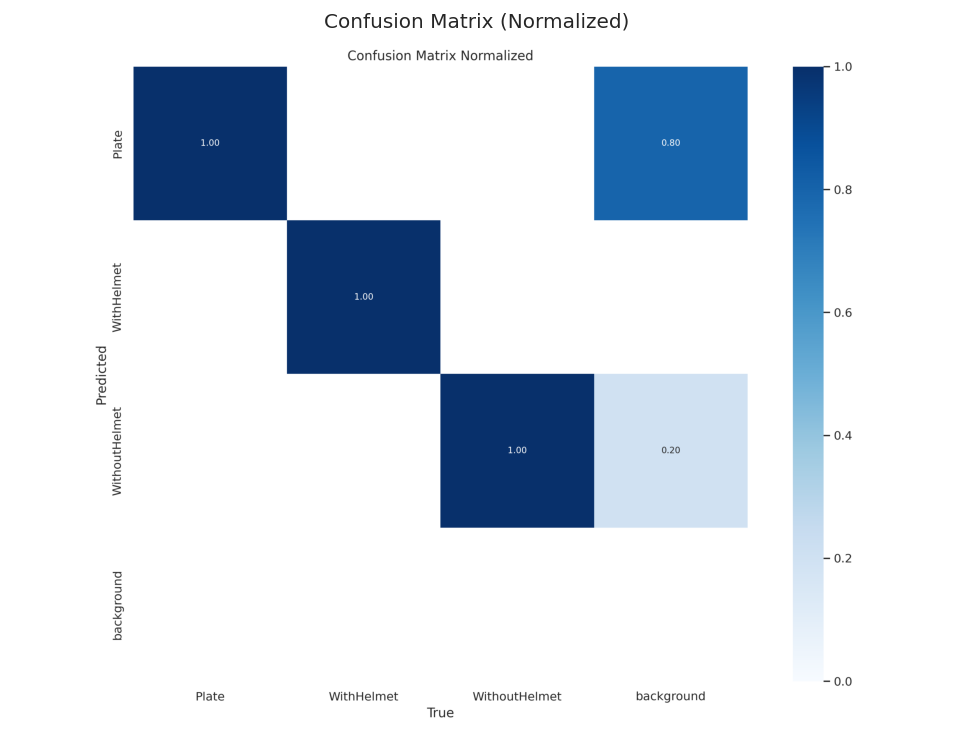

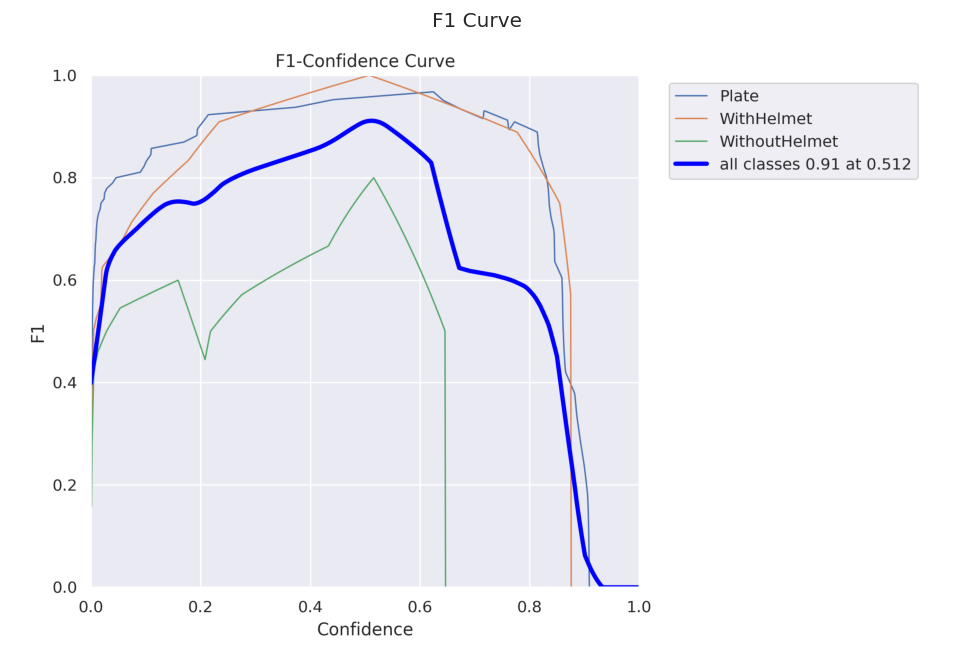

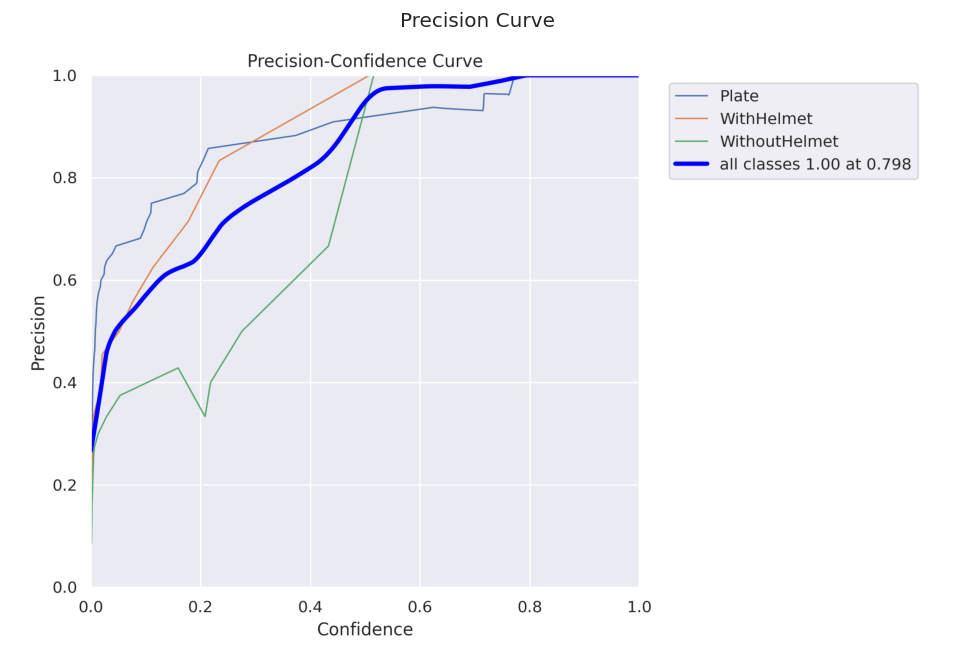

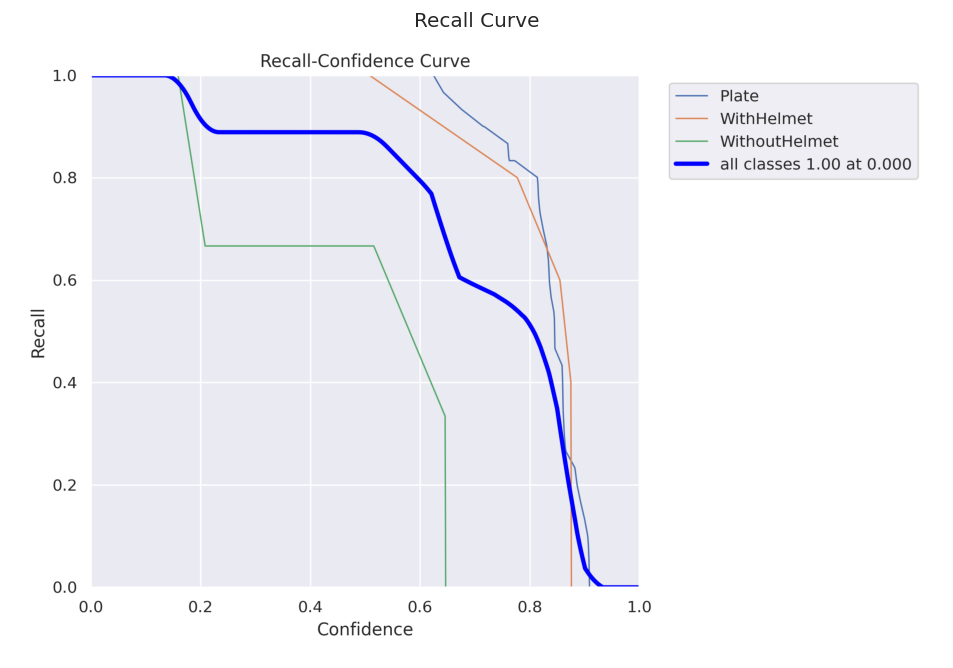

In [ ]:
# Define the file names and their corresponding display titles
file_names = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png'
]

titles = [
    'Confusion Matrix (Normalized)',
    'F1 Curve',
    'Precision Curve',
    'Recall Curve'
]

# Loop through each file, process, and display the images
for file_name, title in zip(file_names, titles):
    # Construct the file path
    file_path = os.path.join(post_training_files_path, file_name)

    # Read the image using cv2
    img = cv2.imread(file_path)

    # Convert the image from BGR to RGB color space
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Display the image
    plt.figure(figsize=(10, 10), dpi=120)
    plt.imshow(img_rgb)
    plt.title(title)
    plt.axis('off')
    plt.show()


<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227''> |</span></b> Validation Model By ValSet</b></p>
</div>

In [ ]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join('/content/drive/My Drive/Colab Notebooks/dataset/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(data='/content/drive/My Drive/Colab Notebooks/dataset/HelmetViolationsV2/data.yaml', split='val')
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFram
metrics_df.round(3)


NameError: name 'os' is not defined

In [ ]:
import pandas as pd
from ultralytics import YOLO
import wandb
import warnings

# Suppress warnings
warnings.filterwarnings('ignore')

# Login to Weights & Biases
wandb.login()

# Define the path to the best model weights
best_model_path = '/content/drive/My Drive/Colab Notebooks/dataset/best.pt'

# Load the best trained YOLO model
model = YOLO(best_model_path)

# Validate the model
metrics = model.val(data='/content/drive/My Drive/Colab Notebooks/dataset/HelmetViolationsV2/data.yaml', split='val')
metrics_dict = metrics.results_dict

# Extract performance metrics
map_50 = metrics_dict.get('metrics/mAP_50(B)', None)
map_50_95 = metrics_dict.get('metrics/mAP_50-95(B)', None)
precision = metrics_dict.get('metrics/precision(B)', None)
recall = metrics_dict.get('metrics/recall(B)', None)
f1_score = metrics_dict.get('metrics/F1(B)', None)

# Calculate accuracy (using F1-score as a proxy)
if precision is not None and recall is not None and (precision + recall) > 0:
    accuracy = (2 * precision * recall) / (precision + recall)
else:
    accuracy = None

# Print results
if map_50 is not None:
    print(f"mAP@50: {map_50:.2f}")
if map_50_95 is not None:
    print(f"mAP@50-95: {map_50_95:.2f}")
if precision is not None:
    print(f"Precision: {precision:.2f}")
if recall is not None:
    print(f"Recall: {recall:.2f}")
if f1_score is not None:
    print(f"F1-score: {f1_score:.2f}")
if accuracy is not None:
    print(f"Accuracy (Approximate): {accuracy:.2f}")

# Convert metrics to DataFrame and save
metrics_df = pd.DataFrame.from_dict(metrics_dict, orient='index', columns=['Metric Value'])
metrics_df.loc['accuracy'] = accuracy  # Add accuracy to DataFrame
metrics_df.to_csv('model_metrics.csv', index=True)
print("Metrics saved to model_metrics.csv")


Ultralytics 8.3.83 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
YOLOv9e summary (fused): 279 layers, 57,378,713 parameters, 0 gradients, 189.1 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 3.80MB/s]
val: Scanning /content/drive/My Drive/Colab Notebooks/dataset/HelmetViolationsV2/valid/labels.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [04:06<00:00, 123.50s/it]


                   all         30         38      0.798      0.913      0.911      0.661
                 Plate         30         30      0.925      0.967      0.983      0.651
            WithHelmet          5          5      0.726        0.8       0.92      0.679
         WithoutHelmet          3          3      0.743      0.973       0.83      0.654
Speed: 12.8ms preprocess, 7458.6ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/val
Precision: 0.80
Recall: 0.91
Accuracy (Approximate): 0.85
Metrics saved to model_metrics.csv


## <b>7 <span style='color:#e61227'>|</span> Inference on an Unseen Test Images </b>  

In [ ]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = '/content/drive/My Drive/Colab Notebooks/dataset/HelmetViolationsV2'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 15)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])

            # Load image
            image = cv2.imread(image_path)

            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)

                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)

                # Predict with the model
                results = best_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)

                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()



Output hidden; open in https://colab.research.google.com to view.

## <b>9 <span style='color:#e61227'>|</span> Real-Time Helmet Violation </b>  

In [ ]:
class YOLODetector:
    def __init__(self, path_of_model):
        self.model = YOLO(path_of_model)
        self.ocr = PaddleOCR(use_angle_cls=True, lang='en')

    def preprocess(self, image):
        image = np.array(image)
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        image = cv2.resize(image, (640, 640))
        image = image / 255.0
        return image

    def predict_frame(self, frame):
        original_image = frame.copy()
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        preprocessed_image = self.preprocess(image)

        # Convert back to PIL Image for YOLO model compatibility
        preprocessed_image = (preprocessed_image * 255).astype(np.uint8)
        image = Image.fromarray(preprocessed_image)

        # Predict and process results using the YOLO model
        results = self.model(image)
        if results is None or len(results[0].boxes) == 0:
            return original_image, []

        detections = results[0].boxes.xyxy
        class_ids = results[0].boxes.cls
        confidences = results[0].boxes.conf

        plate_numbers = []

        # Check for "WithoutHelmet" class before processing license plates
        without_helmet_detected = any(cls == 2 for cls in class_ids)  # Assuming 2 is the class ID for "WithoutHelmet"

        for idx, (box, class_id, confidence) in enumerate(zip(detections, class_ids, confidences)):
            plate_number = None  # Initialize plate_number for each iteration
            if class_id == 0 and without_helmet_detected:  # Class ID for license plate and "WithoutHelmet" condition
                # Convert coordinates
                scale_x = original_image.shape[1] / 640
                scale_y = original_image.shape[0] / 640
                x1, y1, x2, y2 = (box.cpu().numpy() * [scale_x, scale_y, scale_x, scale_y]).round().astype(int)

                # Ensure bounding box is within image boundaries
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(original_image.shape[1], x2), min(original_image.shape[0], y2)

                # Crop the plate region
                plate_region = original_image[y1:y2, x1:x2]
                if plate_region is None or plate_region.size == 0:
                    continue

                # Preprocess and apply OCR using PaddleOCR
                try:
                    ocr_results = self.ocr.ocr(plate_region, cls=True)
                    text = ''.join([line[1][0] for line in ocr_results[0]])
                    plate_number = text.strip()
                    # Check length of extracted plate number
                    if len(plate_number) >= 9:
                        plate_numbers.append(plate_number)
                        print(f"PaddleOCR result: {plate_number}")
                except Exception as e:
                    print(f"Error during OCR processing: {e}")

                # Draw the bounding box and label
                cv2.rectangle(original_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(original_image, plate_number if plate_number else "", (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        return original_image, plate_numbers

    def process_video(self, video_path, output_csv):
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            raise ValueError(f"Cannot open video file {video_path}")

        all_plate_numbers = set()

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            annotated_frame, plate_numbers = self.predict_frame(frame)
            if plate_numbers:
                all_plate_numbers.update(plate_numbers)

            # Display frame using matplotlib instead of cv2.imshow
            plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.pause(0.001)  # Small pause to simulate real-time display

        cap.release()
        plt.close()

        # Write plate numbers
        for plate in all_plate_numbers:
            print(plate)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize model and paths
path_of_model = "/content/drive/My Drive/Colab Notebooks/dataset/best.pt"
path_of_video = "/content/drive/My Drive/Colab Notebooks/dataset/22.mp4"
PlateNumber = []
model = YOLODetector(path_of_model)

# Process video and save results
model.process_video(path_of_video, PlateNumber)


Output hidden; open in https://colab.research.google.com to view.

download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 3910/3910 [00:11<00:00, 338.72it/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10000/10000 [00:12<00:00, 771.16it/s]


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2138/2138 [00:10<00:00, 205.16it/s]


[2025/03/05 07:47:47] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_c

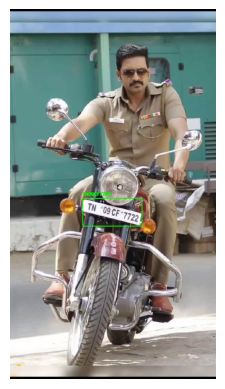


0: 640x640 1 Plate, 1 WithoutHelmet, 5646.0ms
Speed: 3.9ms preprocess, 5646.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:03] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.05747079849243164
[2025/03/05 07:48:03] ppocr DEBUG: cls num  : 1, elapsed : 0.01547551155090332
[2025/03/05 07:48:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09266018867492676
PaddleOCR result: TN09CF7722


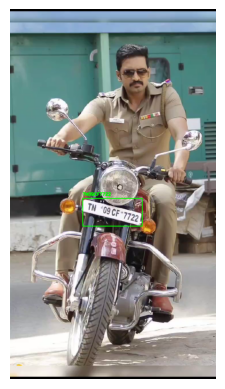


0: 640x640 1 Plate, 1 WithoutHelmet, 5235.3ms
Speed: 3.9ms preprocess, 5235.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:09] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026053190231323242
[2025/03/05 07:48:09] ppocr DEBUG: cls num  : 1, elapsed : 0.012536287307739258
[2025/03/05 07:48:09] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06098580360412598
PaddleOCR result: TN09CF7722


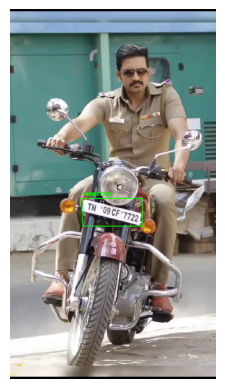


0: 640x640 1 Plate, 1 WithoutHelmet, 4689.7ms
Speed: 4.2ms preprocess, 4689.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:14] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.029609203338623047
[2025/03/05 07:48:14] ppocr DEBUG: cls num  : 1, elapsed : 0.013404130935668945
[2025/03/05 07:48:14] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05894756317138672
PaddleOCR result: TN09CF7722


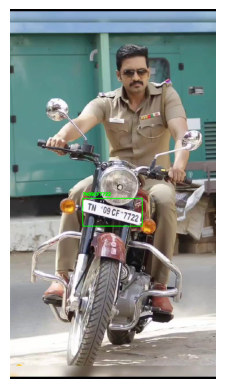


0: 640x640 1 Plate, 1 WithoutHelmet, 6282.3ms
Speed: 3.7ms preprocess, 6282.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:21] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027045011520385742
[2025/03/05 07:48:21] ppocr DEBUG: cls num  : 1, elapsed : 0.014233112335205078
[2025/03/05 07:48:21] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0599062442779541
PaddleOCR result: TN09CF7722


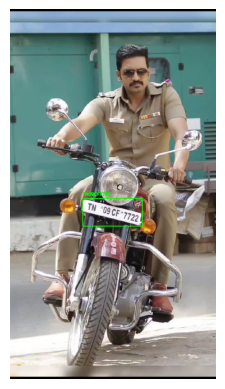


0: 640x640 1 Plate, 1 WithoutHelmet, 4694.6ms
Speed: 4.1ms preprocess, 4694.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025669336318969727
[2025/03/05 07:48:26] ppocr DEBUG: cls num  : 1, elapsed : 0.013437986373901367
[2025/03/05 07:48:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06650090217590332
PaddleOCR result: TN09CF7722


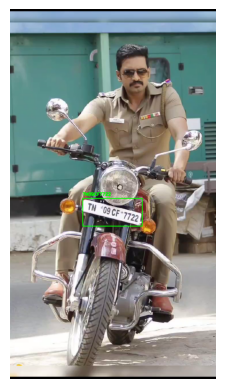


0: 640x640 1 Plate, 1 WithoutHelmet, 5332.2ms
Speed: 4.0ms preprocess, 5332.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:31] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03927803039550781
[2025/03/05 07:48:31] ppocr DEBUG: cls num  : 1, elapsed : 0.020290851593017578
[2025/03/05 07:48:31] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08967781066894531
PaddleOCR result: TN09CF7722


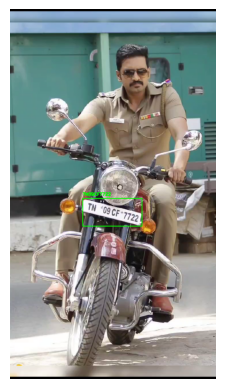


0: 640x640 1 Plate, 1 WithoutHelmet, 5598.6ms
Speed: 5.2ms preprocess, 5598.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:37] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027765750885009766
[2025/03/05 07:48:37] ppocr DEBUG: cls num  : 1, elapsed : 0.014539003372192383
[2025/03/05 07:48:37] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07265639305114746
PaddleOCR result: TN09CF7722


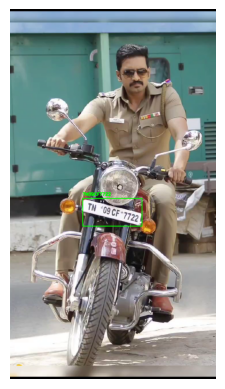


0: 640x640 1 Plate, 1 WithoutHelmet, 4723.2ms
Speed: 4.0ms preprocess, 4723.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02839970588684082
[2025/03/05 07:48:42] ppocr DEBUG: cls num  : 1, elapsed : 0.013785123825073242
[2025/03/05 07:48:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08138799667358398
PaddleOCR result: TN09CF7722


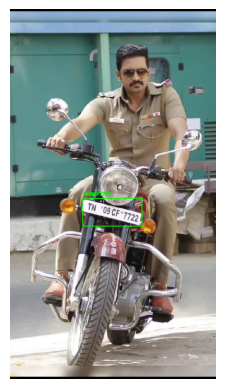


0: 640x640 1 Plate, 1 WithoutHelmet, 6299.3ms
Speed: 4.1ms preprocess, 6299.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:49] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026852846145629883
[2025/03/05 07:48:49] ppocr DEBUG: cls num  : 1, elapsed : 0.014671087265014648
[2025/03/05 07:48:49] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08597540855407715
PaddleOCR result: TN09CF7722


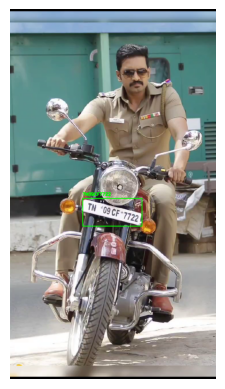


0: 640x640 1 Plate, 1 WithoutHelmet, 5291.9ms
Speed: 4.0ms preprocess, 5291.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:48:55] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02700662612915039
[2025/03/05 07:48:55] ppocr DEBUG: cls num  : 1, elapsed : 0.015012741088867188
[2025/03/05 07:48:55] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0857539176940918
PaddleOCR result: TN09CF7722


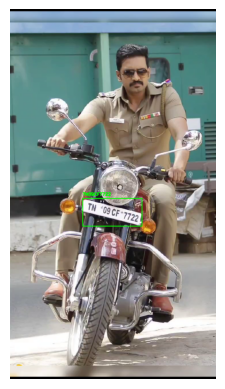


0: 640x640 1 Plate, 1 WithoutHelmet, 5568.6ms
Speed: 4.1ms preprocess, 5568.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:01] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.035199880599975586
[2025/03/05 07:49:01] ppocr DEBUG: cls num  : 1, elapsed : 0.02120208740234375
[2025/03/05 07:49:01] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08831906318664551
PaddleOCR result: TN09CF7722


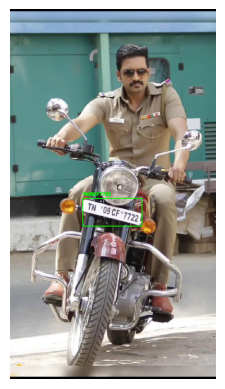


0: 640x640 1 Plate, 1 WithoutHelmet, 5491.0ms
Speed: 4.2ms preprocess, 5491.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04193735122680664
[2025/03/05 07:49:07] ppocr DEBUG: cls num  : 1, elapsed : 0.01486515998840332
[2025/03/05 07:49:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0819559097290039
PaddleOCR result: TN09CF7722


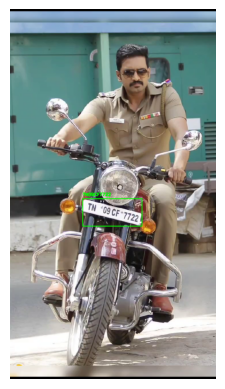


0: 640x640 1 Plate, 1 WithoutHelmet, 4727.9ms
Speed: 4.0ms preprocess, 4727.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:12] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03288626670837402
[2025/03/05 07:49:12] ppocr DEBUG: cls num  : 1, elapsed : 0.023000478744506836
[2025/03/05 07:49:12] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10180926322937012
PaddleOCR result: TN09CF7722


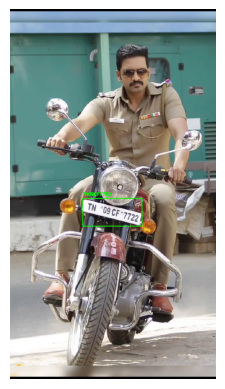


0: 640x640 1 Plate, 1 WithoutHelmet, 6349.3ms
Speed: 4.2ms preprocess, 6349.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026455402374267578
[2025/03/05 07:49:19] ppocr DEBUG: cls num  : 1, elapsed : 0.013132333755493164
[2025/03/05 07:49:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08402180671691895
PaddleOCR result: TN09CF7722


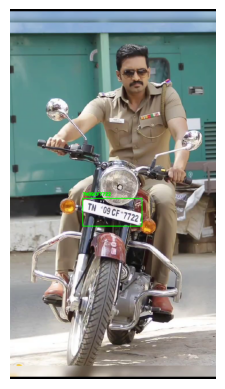


0: 640x640 1 Plate, 1 WithoutHelmet, 4763.1ms
Speed: 4.0ms preprocess, 4763.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03899836540222168
[2025/03/05 07:49:24] ppocr DEBUG: cls num  : 1, elapsed : 0.014206647872924805
[2025/03/05 07:49:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08385872840881348
PaddleOCR result: TN09CF7722


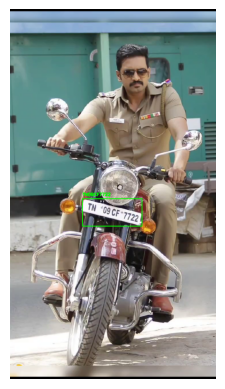


0: 640x640 1 Plate, 1 WithoutHelmet, 5590.0ms
Speed: 3.9ms preprocess, 5590.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:30] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03550910949707031
[2025/03/05 07:49:30] ppocr DEBUG: cls num  : 1, elapsed : 0.014963150024414062
[2025/03/05 07:49:30] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08210563659667969
PaddleOCR result: TN09CF7722


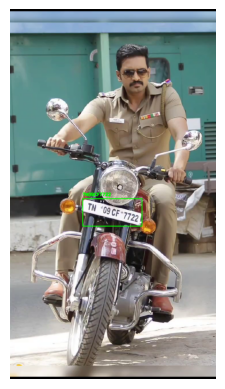


0: 640x640 1 Plate, 1 WithoutHelmet, 5600.8ms
Speed: 3.8ms preprocess, 5600.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:36] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02750086784362793
[2025/03/05 07:49:36] ppocr DEBUG: cls num  : 1, elapsed : 0.013633489608764648
[2025/03/05 07:49:36] ppocr DEBUG: rec_res num  : 1, elapsed : 0.1070091724395752
PaddleOCR result: TN09CF*7722


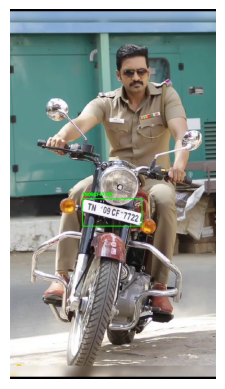


0: 640x640 1 Plate, 1 WithoutHelmet, 4754.5ms
Speed: 4.8ms preprocess, 4754.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:41] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025168180465698242
[2025/03/05 07:49:41] ppocr DEBUG: cls num  : 1, elapsed : 0.01511693000793457
[2025/03/05 07:49:41] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10045266151428223
PaddleOCR result: TN09CF*7722


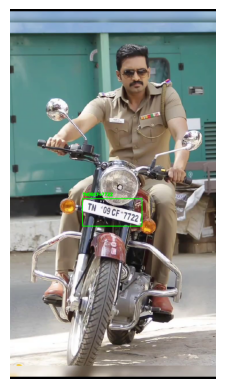


0: 640x640 1 Plate, 1 WithoutHelmet, 6330.4ms
Speed: 3.8ms preprocess, 6330.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026053428649902344
[2025/03/05 07:49:48] ppocr DEBUG: cls num  : 1, elapsed : 0.014041423797607422
[2025/03/05 07:49:48] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08563423156738281
PaddleOCR result: TN09CF7722


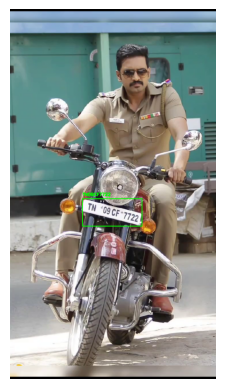


0: 640x640 1 Plate, 1 WithoutHelmet, 4814.8ms
Speed: 3.9ms preprocess, 4814.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:53] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027877092361450195
[2025/03/05 07:49:53] ppocr DEBUG: cls num  : 1, elapsed : 0.013191938400268555
[2025/03/05 07:49:53] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08696222305297852
PaddleOCR result: TN09CF7722


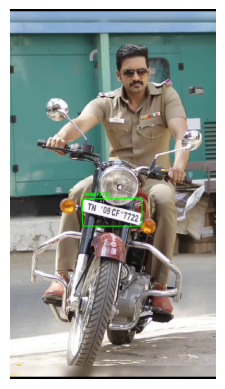


0: 640x640 1 Plate, 1 WithoutHelmet, 5594.0ms
Speed: 4.0ms preprocess, 5594.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:49:59] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.033592939376831055
[2025/03/05 07:49:59] ppocr DEBUG: cls num  : 1, elapsed : 0.027323246002197266
[2025/03/05 07:49:59] ppocr DEBUG: rec_res num  : 1, elapsed : 0.11776018142700195
PaddleOCR result: TN09CF7722


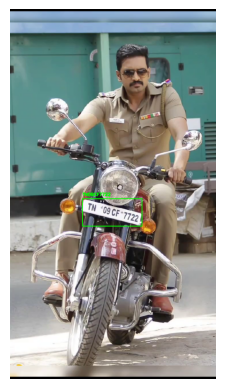


0: 640x640 1 Plate, 1 WithoutHelmet, 5592.1ms
Speed: 4.5ms preprocess, 5592.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:05] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0313105583190918
[2025/03/05 07:50:05] ppocr DEBUG: cls num  : 1, elapsed : 0.016425371170043945
[2025/03/05 07:50:05] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08890962600708008
PaddleOCR result: TN09CF7722


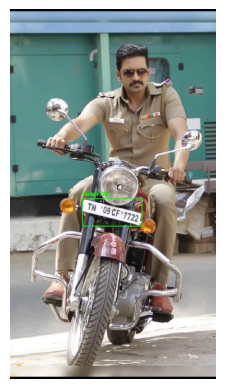


0: 640x640 1 Plate, 1 WithoutHelmet, 4769.4ms
Speed: 4.6ms preprocess, 4769.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027073144912719727
[2025/03/05 07:50:11] ppocr DEBUG: cls num  : 1, elapsed : 0.01352238655090332
[2025/03/05 07:50:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08616185188293457
PaddleOCR result: TN09CF7722


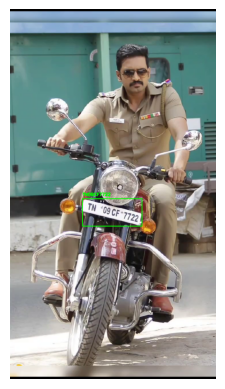


0: 640x640 1 Plate, 1 WithoutHelmet, 6365.3ms
Speed: 4.3ms preprocess, 6365.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04124879837036133
[2025/03/05 07:50:17] ppocr DEBUG: cls num  : 1, elapsed : 0.015038251876831055
[2025/03/05 07:50:18] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08688712120056152
PaddleOCR result: TN09CF7722


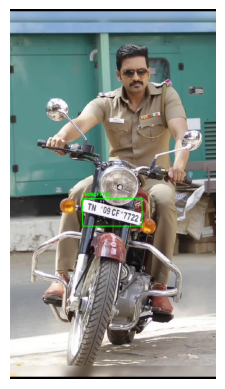


0: 640x640 1 Plate, 1 WithoutHelmet, 4821.8ms
Speed: 3.8ms preprocess, 4821.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:23] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02473616600036621
[2025/03/05 07:50:23] ppocr DEBUG: cls num  : 1, elapsed : 0.012748003005981445
[2025/03/05 07:50:23] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0863337516784668
PaddleOCR result: TN09CF7722


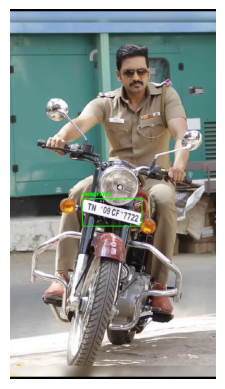


0: 640x640 1 Plate, 1 WithoutHelmet, 5647.2ms
Speed: 3.9ms preprocess, 5647.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0381464958190918
[2025/03/05 07:50:29] ppocr DEBUG: cls num  : 1, elapsed : 0.0156404972076416
[2025/03/05 07:50:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10277819633483887
PaddleOCR result: TN09CF7722


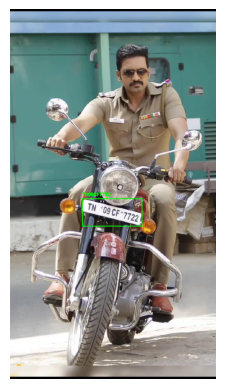


0: 640x640 1 Plate, 1 WithoutHelmet, 5588.9ms
Speed: 8.1ms preprocess, 5588.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025742769241333008
[2025/03/05 07:50:35] ppocr DEBUG: cls num  : 1, elapsed : 0.01450800895690918
[2025/03/05 07:50:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0838463306427002
PaddleOCR result: TN09CF7722


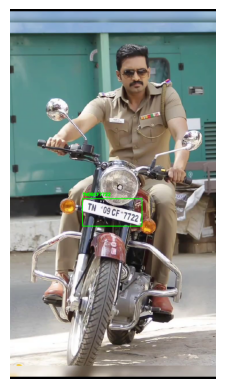


0: 640x640 1 Plate, 1 WithoutHelmet, 4782.7ms
Speed: 3.9ms preprocess, 4782.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:40] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025021791458129883
[2025/03/05 07:50:40] ppocr DEBUG: cls num  : 1, elapsed : 0.01277923583984375
[2025/03/05 07:50:40] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08160543441772461
PaddleOCR result: TN09CF7722


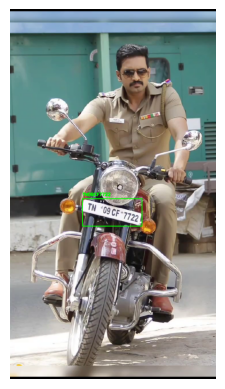


0: 640x640 1 Plate, 1 WithoutHelmet, 6396.3ms
Speed: 4.2ms preprocess, 6396.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025086164474487305
[2025/03/05 07:50:47] ppocr DEBUG: cls num  : 1, elapsed : 0.014412879943847656
[2025/03/05 07:50:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09007906913757324
PaddleOCR result: TN09CF7722


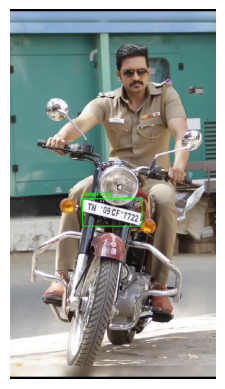


0: 640x640 1 Plate, 1 WithoutHelmet, 4836.2ms
Speed: 4.0ms preprocess, 4836.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:52] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02480769157409668
[2025/03/05 07:50:52] ppocr DEBUG: cls num  : 1, elapsed : 0.012696504592895508
[2025/03/05 07:50:52] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0848379135131836
PaddleOCR result: TN09CF7722


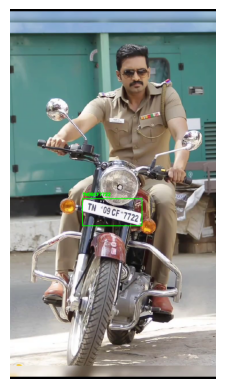


0: 640x640 1 Plate, 1 WithoutHelmet, 5761.0ms
Speed: 3.8ms preprocess, 5761.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:50:58] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03003406524658203
[2025/03/05 07:50:58] ppocr DEBUG: cls num  : 1, elapsed : 0.015443801879882812
[2025/03/05 07:50:59] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0943145751953125
PaddleOCR result: TN09CF7722


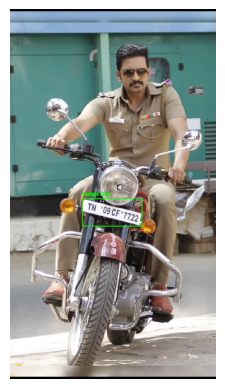


0: 640x640 1 Plate, 1 WithoutHelmet, 5520.0ms
Speed: 3.7ms preprocess, 5520.0ms inference, 8.5ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:51:05] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024680137634277344
[2025/03/05 07:51:05] ppocr DEBUG: cls num  : 1, elapsed : 0.014711141586303711
[2025/03/05 07:51:05] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08858656883239746
PaddleOCR result: TN09CF7722


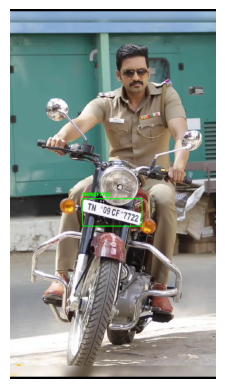


0: 640x640 1 Plate, 1 WithoutHelmet, 4816.9ms
Speed: 4.3ms preprocess, 4816.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:51:10] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024849414825439453
[2025/03/05 07:51:10] ppocr DEBUG: cls num  : 1, elapsed : 0.014161825180053711
[2025/03/05 07:51:10] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08914542198181152
PaddleOCR result: TN09CF7722


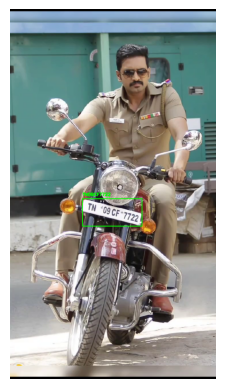


0: 640x640 1 Plate, 1 WithoutHelmet, 6428.8ms
Speed: 3.8ms preprocess, 6428.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:51:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03680253028869629
[2025/03/05 07:51:17] ppocr DEBUG: cls num  : 1, elapsed : 0.013199090957641602
[2025/03/05 07:51:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0829017162322998
PaddleOCR result: TN09CF7722


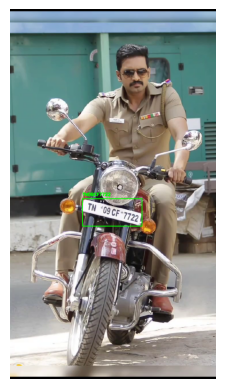


0: 640x640 1 Plate, 1 WithoutHelmet, 4835.0ms
Speed: 3.9ms preprocess, 4835.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:51:22] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03937649726867676
[2025/03/05 07:51:22] ppocr DEBUG: cls num  : 1, elapsed : 0.014750957489013672
[2025/03/05 07:51:22] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09139871597290039
PaddleOCR result: TN09CF7722


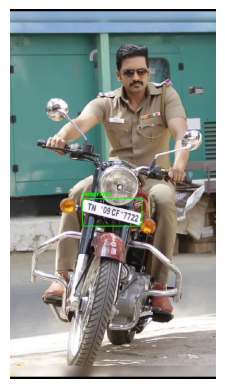


0: 640x640 1 Plate, 1 WithoutHelmet, 5949.5ms
Speed: 4.1ms preprocess, 5949.5ms inference, 14.1ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:51:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03844571113586426
[2025/03/05 07:51:29] ppocr DEBUG: cls num  : 1, elapsed : 0.017108440399169922
[2025/03/05 07:51:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0845639705657959
PaddleOCR result: TN09CF7722


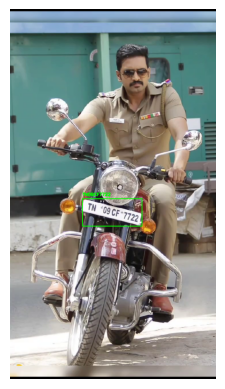


0: 640x640 1 Plate, 1 WithoutHelmet, 5479.1ms
Speed: 6.9ms preprocess, 5479.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:51:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.029909372329711914
[2025/03/05 07:51:35] ppocr DEBUG: cls num  : 1, elapsed : 0.014633417129516602
[2025/03/05 07:51:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0910789966583252
PaddleOCR result: TN09CF7722


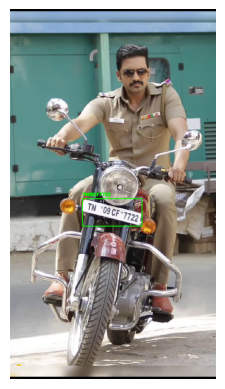


0: 640x640 1 Plate, 1 WithoutHelmet, 4887.4ms
Speed: 4.1ms preprocess, 4887.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:51:40] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027043581008911133
[2025/03/05 07:51:40] ppocr DEBUG: cls num  : 1, elapsed : 0.014857053756713867
[2025/03/05 07:51:40] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09094119071960449
PaddleOCR result: TN09CF7722


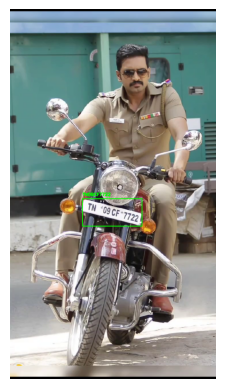


0: 640x640 1 Plate, 1 WithoutHelmet, 7608.9ms
Speed: 4.2ms preprocess, 7608.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:51:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04867434501647949
[2025/03/05 07:51:48] ppocr DEBUG: cls num  : 1, elapsed : 0.023227214813232422
[2025/03/05 07:51:48] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10836362838745117
PaddleOCR result: TN09CF7722


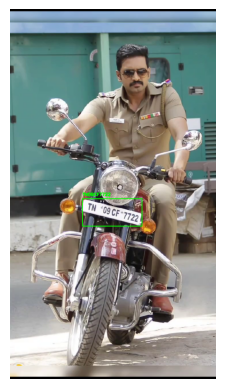


0: 640x640 1 Plate, 1 WithoutHelmet, 5556.6ms
Speed: 4.0ms preprocess, 5556.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:51:54] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027701139450073242
[2025/03/05 07:51:54] ppocr DEBUG: cls num  : 1, elapsed : 0.013283252716064453
[2025/03/05 07:51:54] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08594536781311035
PaddleOCR result: TN09CF7722


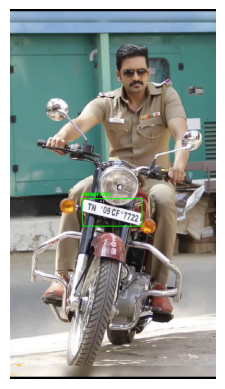


0: 640x640 1 Plate, 1 WithoutHelmet, 6486.3ms
Speed: 7.3ms preprocess, 6486.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:52:01] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.028889179229736328
[2025/03/05 07:52:01] ppocr DEBUG: cls num  : 1, elapsed : 0.01505422592163086
[2025/03/05 07:52:01] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08477544784545898
PaddleOCR result: TN09CF7722


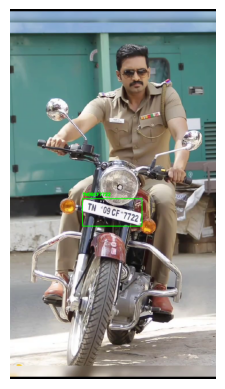


0: 640x640 1 Plate, 1 WithoutHelmet, 4945.8ms
Speed: 4.0ms preprocess, 4945.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:52:06] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02697610855102539
[2025/03/05 07:52:07] ppocr DEBUG: cls num  : 1, elapsed : 0.012825489044189453
[2025/03/05 07:52:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08320236206054688
PaddleOCR result: TN09CF7722


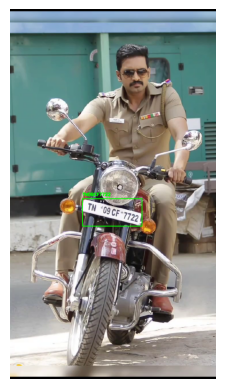


0: 640x640 1 Plate, 1 WithoutHelmet, 5768.3ms
Speed: 4.0ms preprocess, 5768.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:52:13] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02777838706970215
[2025/03/05 07:52:13] ppocr DEBUG: cls num  : 1, elapsed : 0.013088464736938477
[2025/03/05 07:52:13] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0864098072052002
PaddleOCR result: TN09CF7722


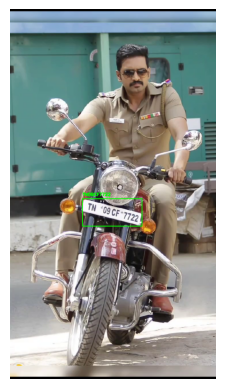


0: 640x640 1 Plate, 1 WithoutHelmet, 5818.6ms
Speed: 3.9ms preprocess, 5818.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:52:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025304079055786133
[2025/03/05 07:52:19] ppocr DEBUG: cls num  : 1, elapsed : 0.0161898136138916
[2025/03/05 07:52:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08836579322814941
PaddleOCR result: TN09CF7722


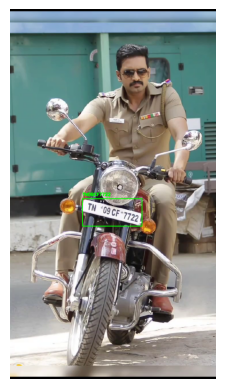


0: 640x640 1 Plate, 1 WithoutHelmet, 4954.9ms
Speed: 3.9ms preprocess, 4954.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:52:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026358842849731445
[2025/03/05 07:52:24] ppocr DEBUG: cls num  : 1, elapsed : 0.013077735900878906
[2025/03/05 07:52:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08904719352722168
PaddleOCR result: TN09CF7722


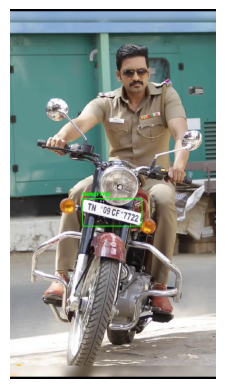


0: 640x640 1 Plate, 1 WithoutHelmet, 8519.6ms
Speed: 4.0ms preprocess, 8519.6ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:52:33] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.10556507110595703
[2025/03/05 07:52:34] ppocr DEBUG: cls num  : 1, elapsed : 0.05801796913146973
[2025/03/05 07:52:34] ppocr DEBUG: rec_res num  : 1, elapsed : 0.352952241897583
PaddleOCR result: TN09CF7722


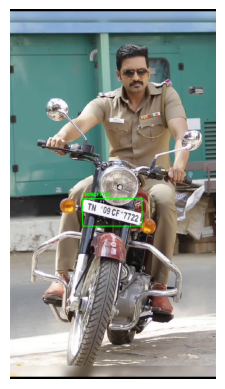


0: 640x640 1 Plate, 1 WithoutHelmet, 6635.5ms
Speed: 16.1ms preprocess, 6635.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:52:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0327916145324707
[2025/03/05 07:52:42] ppocr DEBUG: cls num  : 1, elapsed : 0.013802289962768555
[2025/03/05 07:52:42] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09835124015808105
PaddleOCR result: TN09CF7722


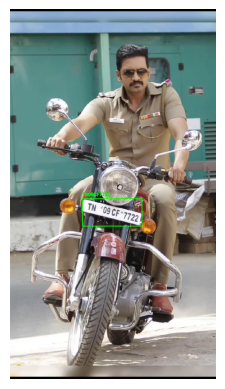


0: 640x640 1 Plate, 1 WithoutHelmet, 6247.5ms
Speed: 6.0ms preprocess, 6247.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:52:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04008007049560547
[2025/03/05 07:52:48] ppocr DEBUG: cls num  : 1, elapsed : 0.01283407211303711
[2025/03/05 07:52:49] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08810973167419434
PaddleOCR result: TN09CF7722


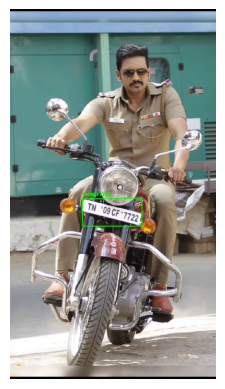


0: 640x640 1 Plate, 1 WithoutHelmet, 5174.0ms
Speed: 4.0ms preprocess, 5174.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:52:54] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03917884826660156
[2025/03/05 07:52:54] ppocr DEBUG: cls num  : 1, elapsed : 0.013213157653808594
[2025/03/05 07:52:54] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09191393852233887
PaddleOCR result: TN09CF7722


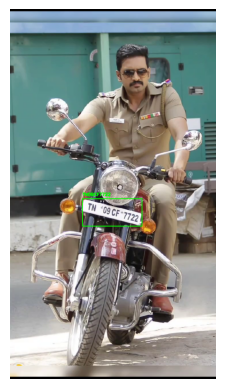


0: 640x640 1 Plate, 1 WithoutHelmet, 6539.6ms
Speed: 4.0ms preprocess, 6539.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:01] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027871370315551758
[2025/03/05 07:53:01] ppocr DEBUG: cls num  : 1, elapsed : 0.016249418258666992
[2025/03/05 07:53:01] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08280706405639648
PaddleOCR result: TN09CF7722


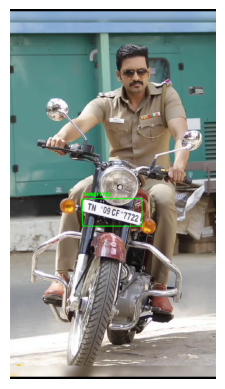


0: 640x640 1 Plate, 1 WithoutHelmet, 5038.6ms
Speed: 4.0ms preprocess, 5038.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026088476181030273
[2025/03/05 07:53:07] ppocr DEBUG: cls num  : 1, elapsed : 0.01407766342163086
[2025/03/05 07:53:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08546590805053711
PaddleOCR result: TN09CF7722


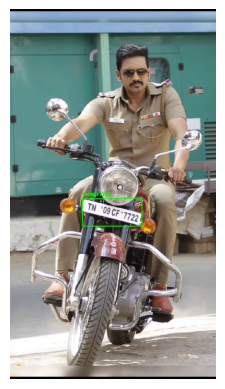


0: 640x640 1 Plate, 1 WithoutHelmet, 6118.7ms
Speed: 3.8ms preprocess, 6118.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:13] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04998302459716797
[2025/03/05 07:53:13] ppocr DEBUG: cls num  : 1, elapsed : 0.013483047485351562
[2025/03/05 07:53:13] ppocr DEBUG: rec_res num  : 1, elapsed : 0.12220191955566406
PaddleOCR result: TN09CF7722


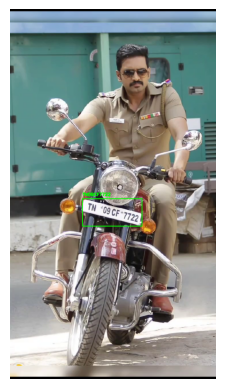


0: 640x640 1 Plate, 1 WithoutHelmet, 5647.1ms
Speed: 3.9ms preprocess, 5647.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026444435119628906
[2025/03/05 07:53:19] ppocr DEBUG: cls num  : 1, elapsed : 0.01385807991027832
[2025/03/05 07:53:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08510828018188477
PaddleOCR result: TN09CF7722


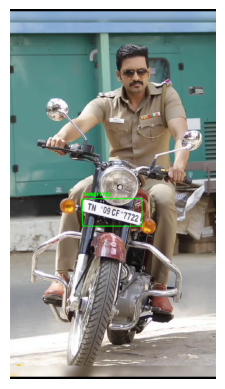


0: 640x640 1 Plate, 1 WithoutHelmet, 5045.3ms
Speed: 4.0ms preprocess, 5045.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.028196334838867188
[2025/03/05 07:53:25] ppocr DEBUG: cls num  : 1, elapsed : 0.014225006103515625
[2025/03/05 07:53:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0851900577545166
PaddleOCR result: TN09CF7722


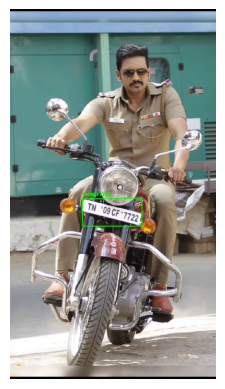


0: 640x640 1 Plate, 1 WithoutHelmet, 6655.4ms
Speed: 3.8ms preprocess, 6655.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.028266429901123047
[2025/03/05 07:53:32] ppocr DEBUG: cls num  : 1, elapsed : 0.015106201171875
[2025/03/05 07:53:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08762001991271973
PaddleOCR result: TN09CF7722


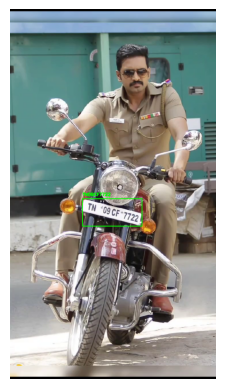


0: 640x640 1 Plate, 1 WithoutHelmet, 5069.5ms
Speed: 4.1ms preprocess, 5069.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:38] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02745985984802246
[2025/03/05 07:53:38] ppocr DEBUG: cls num  : 1, elapsed : 0.013913869857788086
[2025/03/05 07:53:38] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08456921577453613
PaddleOCR result: TN09CF7722


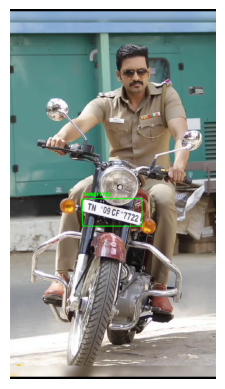


0: 640x640 1 Plate, 1 WithoutHelmet, 6536.9ms
Speed: 3.8ms preprocess, 6536.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:45] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03162860870361328
[2025/03/05 07:53:45] ppocr DEBUG: cls num  : 1, elapsed : 0.019970417022705078
[2025/03/05 07:53:45] ppocr DEBUG: rec_res num  : 1, elapsed : 0.1023867130279541
PaddleOCR result: TN09CF7722


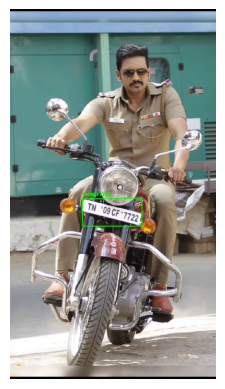


0: 640x640 1 Plate, 1 WithoutHelmet, 5272.8ms
Speed: 3.8ms preprocess, 5272.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:50] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026197433471679688
[2025/03/05 07:53:50] ppocr DEBUG: cls num  : 1, elapsed : 0.014854669570922852
[2025/03/05 07:53:50] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08535242080688477
PaddleOCR result: TN09CF7722


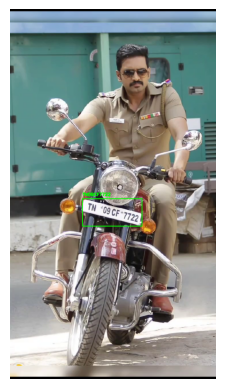


0: 640x640 1 Plate, 1 WithoutHelmet, 5282.6ms
Speed: 4.1ms preprocess, 5282.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:53:56] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025175809860229492
[2025/03/05 07:53:56] ppocr DEBUG: cls num  : 1, elapsed : 0.013798713684082031
[2025/03/05 07:53:56] ppocr DEBUG: rec_res num  : 1, elapsed : 0.11031913757324219
PaddleOCR result: TN09CF7722


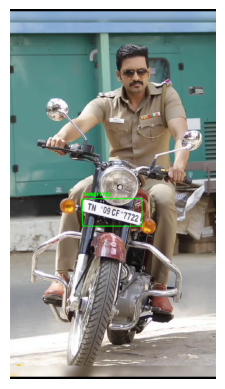


0: 640x640 1 Plate, 1 WithoutHelmet, 6540.3ms
Speed: 3.7ms preprocess, 6540.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:54:03] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025677919387817383
[2025/03/05 07:54:03] ppocr DEBUG: cls num  : 1, elapsed : 0.015979290008544922
[2025/03/05 07:54:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08336019515991211
PaddleOCR result: TN09CF7722


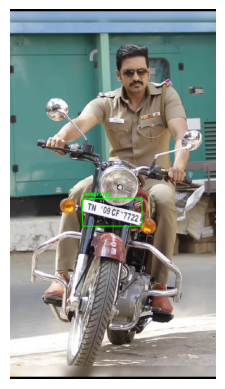


0: 640x640 1 Plate, 1 WithoutHelmet, 5024.2ms
Speed: 4.1ms preprocess, 5024.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:54:09] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025521039962768555
[2025/03/05 07:54:09] ppocr DEBUG: cls num  : 1, elapsed : 0.013291120529174805
[2025/03/05 07:54:09] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08350396156311035
PaddleOCR result: TN09CF7722


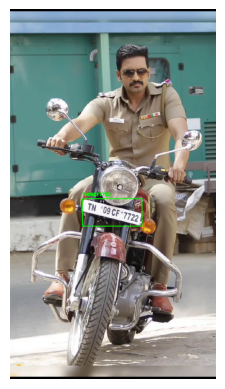


0: 640x640 1 Plate, 1 WithoutHelmet, 6826.3ms
Speed: 4.0ms preprocess, 6826.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:54:16] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02481675148010254
[2025/03/05 07:54:16] ppocr DEBUG: cls num  : 1, elapsed : 0.012483358383178711
[2025/03/05 07:54:16] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08114910125732422
PaddleOCR result: TN09CF7722


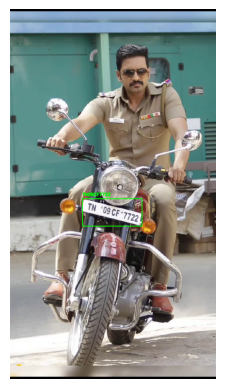


0: 640x640 1 Plate, 1 WithoutHelmet, 5168.8ms
Speed: 4.0ms preprocess, 5168.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:54:21] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0450291633605957
[2025/03/05 07:54:21] ppocr DEBUG: cls num  : 1, elapsed : 0.013426780700683594
[2025/03/05 07:54:22] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08322787284851074
PaddleOCR result: TN09CF7722


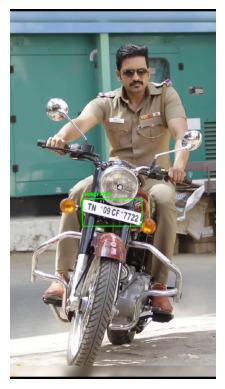


0: 640x640 1 Plate, 1 WithoutHelmet, 5890.4ms
Speed: 4.2ms preprocess, 5890.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:54:28] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03834104537963867
[2025/03/05 07:54:28] ppocr DEBUG: cls num  : 1, elapsed : 0.018119096755981445
[2025/03/05 07:54:28] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09366917610168457
PaddleOCR result: TN09CF7722


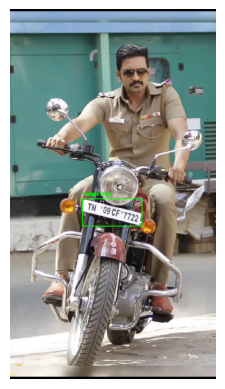


0: 640x640 1 Plate, 1 WithoutHelmet, 5993.4ms
Speed: 7.8ms preprocess, 5993.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:54:34] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.042526960372924805
[2025/03/05 07:54:34] ppocr DEBUG: cls num  : 1, elapsed : 0.012944459915161133
[2025/03/05 07:54:34] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09186625480651855
PaddleOCR result: TN09CF7722


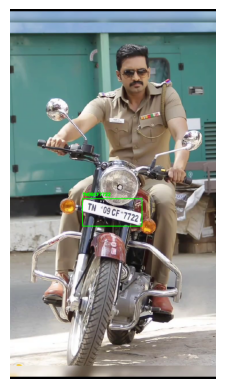


0: 640x640 1 Plate, 1 WithoutHelmet, 5136.8ms
Speed: 4.0ms preprocess, 5136.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:54:40] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0455474853515625
[2025/03/05 07:54:40] ppocr DEBUG: cls num  : 1, elapsed : 0.013604879379272461
[2025/03/05 07:54:40] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08614659309387207
PaddleOCR result: TN09CF7722


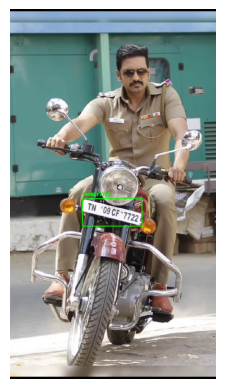


0: 640x640 1 Plate, 1 WithoutHelmet, 6773.4ms
Speed: 3.9ms preprocess, 6773.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:54:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02510690689086914
[2025/03/05 07:54:47] ppocr DEBUG: cls num  : 1, elapsed : 0.013458490371704102
[2025/03/05 07:54:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09499835968017578
PaddleOCR result: TN09CF7722


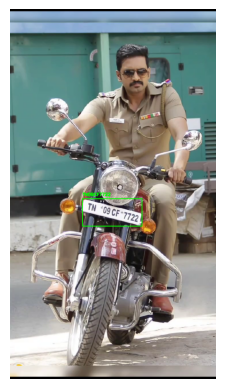


0: 640x640 1 Plate, 1 WithoutHelmet, 5164.7ms
Speed: 3.9ms preprocess, 5164.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:54:53] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026924848556518555
[2025/03/05 07:54:53] ppocr DEBUG: cls num  : 1, elapsed : 0.01573920249938965
[2025/03/05 07:54:53] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08831524848937988
PaddleOCR result: TN09CF7722


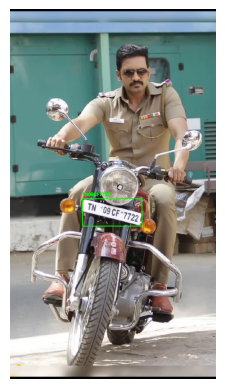


0: 640x640 1 Plate, 1 WithoutHelmet, 6460.9ms
Speed: 4.0ms preprocess, 6460.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:00] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026414155960083008
[2025/03/05 07:55:00] ppocr DEBUG: cls num  : 1, elapsed : 0.017571210861206055
[2025/03/05 07:55:00] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09670329093933105
PaddleOCR result: TN09CF7722


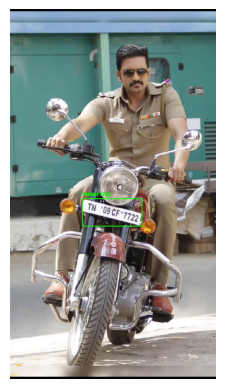


0: 640x640 1 Plate, 1 WithoutHelmet, 5621.6ms
Speed: 3.8ms preprocess, 5621.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:06] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02628779411315918
[2025/03/05 07:55:06] ppocr DEBUG: cls num  : 1, elapsed : 0.014710426330566406
[2025/03/05 07:55:06] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08389163017272949
PaddleOCR result: TN09CF7722


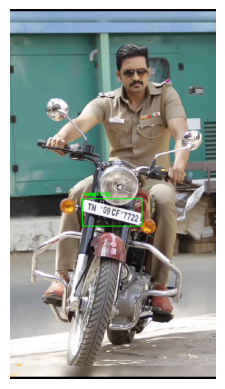


0: 640x640 1 Plate, 1 WithoutHelmet, 5142.3ms
Speed: 4.0ms preprocess, 5142.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024685382843017578
[2025/03/05 07:55:11] ppocr DEBUG: cls num  : 1, elapsed : 0.013200521469116211
[2025/03/05 07:55:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08873343467712402
PaddleOCR result: TN09CF7722


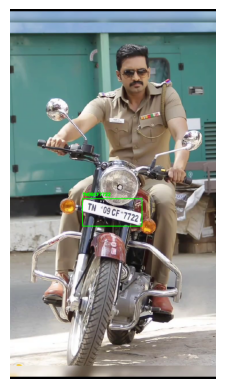


0: 640x640 1 Plate, 1 WithoutHelmet, 6805.7ms
Speed: 4.0ms preprocess, 6805.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.031116008758544922
[2025/03/05 07:55:19] ppocr DEBUG: cls num  : 1, elapsed : 0.013631105422973633
[2025/03/05 07:55:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08481669425964355
PaddleOCR result: TN09CF7722


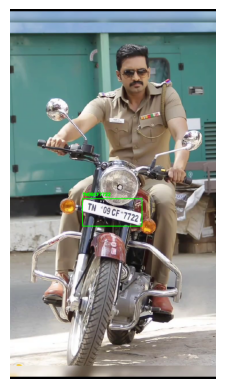


0: 640x640 1 Plate, 1 WithoutHelmet, 5184.1ms
Speed: 3.9ms preprocess, 5184.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025692224502563477
[2025/03/05 07:55:24] ppocr DEBUG: cls num  : 1, elapsed : 0.012702703475952148
[2025/03/05 07:55:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0843205451965332
PaddleOCR result: TN09CF7722


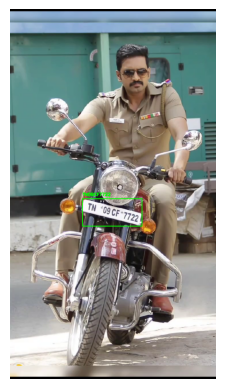


0: 640x640 1 Plate, 1 WithoutHelmet, 6787.9ms
Speed: 4.4ms preprocess, 6787.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0400388240814209
[2025/03/05 07:55:32] ppocr DEBUG: cls num  : 1, elapsed : 0.02366948127746582
[2025/03/05 07:55:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10103702545166016
PaddleOCR result: TN09CF7722


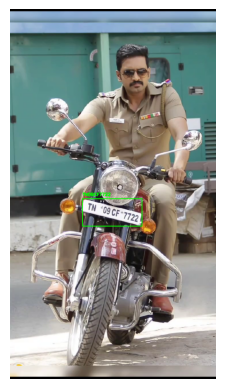


0: 640x640 1 Plate, 1 WithoutHelmet, 5248.6ms
Speed: 4.3ms preprocess, 5248.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:37] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024827003479003906
[2025/03/05 07:55:37] ppocr DEBUG: cls num  : 1, elapsed : 0.012668371200561523
[2025/03/05 07:55:37] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08105969429016113
PaddleOCR result: TN09CF7722


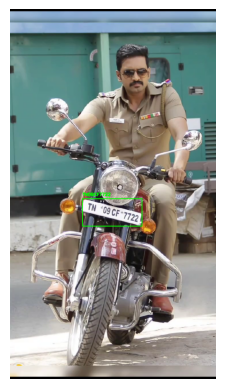


0: 640x640 1 Plate, 1 WithoutHelmet, 5795.1ms
Speed: 3.9ms preprocess, 5795.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:44] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.05203509330749512
[2025/03/05 07:55:44] ppocr DEBUG: cls num  : 1, elapsed : 0.014366865158081055
[2025/03/05 07:55:44] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10498809814453125
PaddleOCR result: TN09CF7722


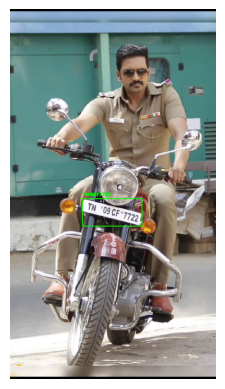


0: 640x640 1 Plate, 1 WithoutHelmet, 6212.8ms
Speed: 3.9ms preprocess, 6212.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:50] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02461409568786621
[2025/03/05 07:55:50] ppocr DEBUG: cls num  : 1, elapsed : 0.015110969543457031
[2025/03/05 07:55:51] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09281706809997559
PaddleOCR result: TN09CF7722


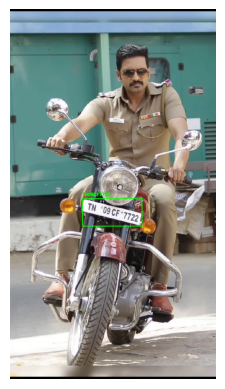


0: 640x640 1 Plate, 1 WithoutHelmet, 5237.8ms
Speed: 4.1ms preprocess, 5237.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:55:56] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026848316192626953
[2025/03/05 07:55:56] ppocr DEBUG: cls num  : 1, elapsed : 0.014297723770141602
[2025/03/05 07:55:56] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08591294288635254
PaddleOCR result: TN09CF7722


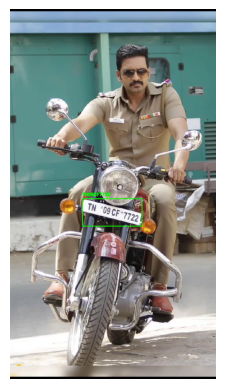


0: 640x640 1 Plate, 1 WithoutHelmet, 7688.1ms
Speed: 3.8ms preprocess, 7688.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:56:04] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03713726997375488
[2025/03/05 07:56:04] ppocr DEBUG: cls num  : 1, elapsed : 0.017204761505126953
[2025/03/05 07:56:04] ppocr DEBUG: rec_res num  : 1, elapsed : 0.11334991455078125
PaddleOCR result: TN09CF7722


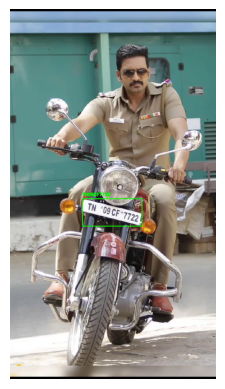


0: 640x640 1 Plate, 1 WithoutHelmet, 6239.9ms
Speed: 7.3ms preprocess, 6239.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:56:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025905609130859375
[2025/03/05 07:56:11] ppocr DEBUG: cls num  : 1, elapsed : 0.013142108917236328
[2025/03/05 07:56:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08601665496826172
PaddleOCR result: TN09CF7722


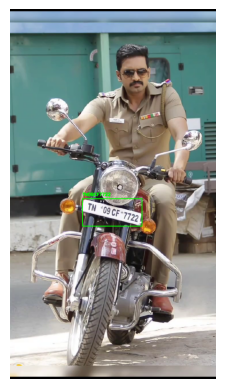


0: 640x640 1 Plate, 1 WithoutHelmet, 5280.4ms
Speed: 3.9ms preprocess, 5280.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:56:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026595592498779297
[2025/03/05 07:56:17] ppocr DEBUG: cls num  : 1, elapsed : 0.012941837310791016
[2025/03/05 07:56:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08243179321289062
PaddleOCR result: TN09CF7722


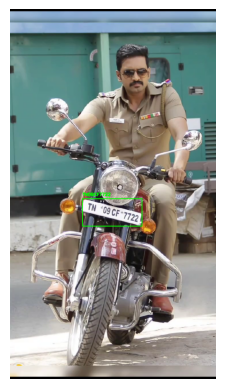


0: 640x640 1 Plate, 1 WithoutHelmet, 6892.8ms
Speed: 4.0ms preprocess, 6892.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:56:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.028051376342773438
[2025/03/05 07:56:24] ppocr DEBUG: cls num  : 1, elapsed : 0.013706207275390625
[2025/03/05 07:56:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08282709121704102
PaddleOCR result: TN09CF7722


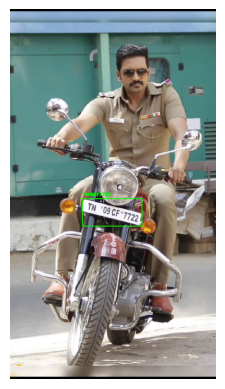


0: 640x640 1 Plate, 1 WithoutHelmet, 5251.5ms
Speed: 4.0ms preprocess, 5251.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
[2025/03/05 07:56:30] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.050893306732177734
[2025/03/05 07:56:30] ppocr DEBUG: cls num  : 1, elapsed : 0.016741037368774414
[2025/03/05 07:56:30] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0899956226348877
PaddleOCR result: TN09CF7722


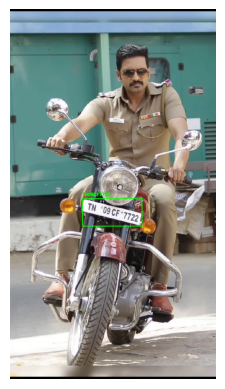

In [ ]:

class YOLODetector:
    def __init__(self, path_of_model):
        self.model = YOLO(path_of_model)
        self.ocr = PaddleOCR(use_angle_cls=True, lang='en')

    def preprocess(self, image):
        image = np.array(image)
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        image = cv2.resize(image, (640, 640))
        image = image / 255.0
        return image

    def predict_frame(self, frame):
        original_image = frame.copy()
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        preprocessed_image = self.preprocess(image)

        # Convert back to PIL Image for YOLO model compatibility
        preprocessed_image = (preprocessed_image * 255).astype(np.uint8)
        image = Image.fromarray(preprocessed_image)

        # Predict and process results using the YOLO model
        results = self.model(image)
        if results is None or len(results[0].boxes) == 0:
            return original_image, []

        detections = results[0].boxes.xyxy
        class_ids = results[0].boxes.cls
        confidences = results[0].boxes.conf

        plate_numbers = []

        # Check for "WithoutHelmet" class before processing license plates
        without_helmet_detected = any(cls == 2 for cls in class_ids)  # Assuming 2 is the class ID for "WithoutHelmet"

        for idx, (box, class_id, confidence) in enumerate(zip(detections, class_ids, confidences)):
            plate_number = None  # Initialize plate_number for each iteration
            if class_id == 0 and without_helmet_detected:  # Class ID for license plate and "WithoutHelmet" condition
                # Convert coordinates
                scale_x = original_image.shape[1] / 640
                scale_y = original_image.shape[0] / 640
                x1, y1, x2, y2 = (box.cpu().numpy() * [scale_x, scale_y, scale_x, scale_y]).round().astype(int)

                # Ensure bounding box is within image boundaries
                x1, y1 = max(0, x1), max(0, y1)
                x2, y2 = min(original_image.shape[1], x2), min(original_image.shape[0], y2)

                # Crop the plate region
                plate_region = original_image[y1:y2, x1:x2]
                if plate_region is None or plate_region.size == 0:
                    continue

                # Preprocess and apply OCR using PaddleOCR
                try:
                    ocr_results = self.ocr.ocr(plate_region, cls=True)
                    text = ''.join([line[1][0] for line in ocr_results[0]])
                    plate_number = text.strip()
                    # Check length of extracted plate number
                    if len(plate_number) >= 9:
                        plate_numbers.append(plate_number)
                        print(f"PaddleOCR result: {plate_number}")
                except Exception as e:
                    print(f"Error during OCR processing: {e}")

                # Draw the bounding box and label
                cv2.rectangle(original_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(original_image, plate_number if plate_number else "", (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        return original_image, plate_numbers

    def process_video(self, video_path, output_csv):
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            raise ValueError(f"Cannot open video file {video_path}")

        all_plate_numbers = set()

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            annotated_frame, plate_numbers = self.predict_frame(frame)
            if plate_numbers:
                all_plate_numbers.update(plate_numbers)

            # Display frame using matplotlib instead of cv2.imshow
            plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.pause(0.001)  # Small pause to simulate real-time display

        cap.release()
        plt.close()

        # Write plate numbers
        for plate in all_plate_numbers:
            print(plate)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize model and paths
path_of_model = "/content/drive/My Drive/Colab Notebooks/dataset/best.pt"
path_of_video = "/content/drive/My Drive/Colab Notebooks/dataset/38.mp4"
PlateNumber = []
model = YOLODetector(path_of_model)

# Process video and save results
model.process_video(path_of_video, PlateNumber)